# Using Machine Learning Tools: Assignment 1

## Overview

In this assignment, you will apply some popular machine learning techniques to the problem of predicting bike rental demand. A data set has been provided containing records of bike rentals in Seoul, collected during 2017-18.

The scenario for this assignment is that you are a new employee of a company (that rents bikes, alongside other activities) and you have been assigned the task of predicting the bike rentals. Your line manager has given you some instructions (those shown below) but is expecting you to be able to do this task without close supervision and to report back with understandable and concise text, graphics and code (and of course the company wants a copy of all the code required to perform this task). Naturally, you are wanting to show that you are a valuable member of the company and although the company allows the use of ChatGPT, you will want to show that you are making useful contributions and that you bring value to the company beyond just being able to type instructions into ChatGPT, as otherwise the company might replace you with a cheaper data entry employee. Hence, you should use ChatGPT whenever you like (or whenever instructed to - see later) but do highlight how your own knowledge and judgement makes a contribution.

The main aims of this assignment are: 

- to practice using tools for loading and viewing data sets;
- to check data for common pitfalls and clean it up;
- to plan a simple experiment and prepare the data accordingly;
- to run your experiment and to report and interpret your results clearly and concisely.

This assignment relates to the following ACS CBOK areas: abstraction, design, hardware and software, data and information, HCI and programming.

## General instructions

This assignment is divided into several tasks. Use the spaces provided in this notebook to answer the questions posed in each task. Some questions require writing code, some require graphical results, and some require short comments or analysis as text. It is your responsibility to make sure your responses are clearly labelled and your code has been fully executed (with the correct results displayed) before submission!

**Do not** manually edit the data set file we have provided! For marking purposes, it's important that your code is written to be able to be run correctly on the original data file.

When creating graphical output, label is clearly, with appropriate titles, xlabels and ylabels, as appropriate.

Most of the tasks in this assignment only require writing a few lines of code! One goal of the assignment is explore [sklearn](https://scikit-learn.org/stable/index.html), [pandas](https://pandas.pydata.org/pandas-docs/stable/index.html), [matplotlib](https://matplotlib.org/stable/index.html) and other libraries you will find useful throughout the course, so feel free to use the functions they provide. You are expected to search and carefully read the documentation for functions that you use, to ensure you are using them correctly.

Chapter 2 of the reference book is based on a similar workflow to this prac, so you may look there for some further background and ideas. You can also use any other general resources on the internet that are relevant, including ChatGPT, although do not use someone else's code or answers that directly relate to these questions. If you take a large portion of code or text from the internet or ChatGPT then you should reference where this was taken from, but we do not expect any references for small pieces of code, such as from documentation, blogs or tutorials. Taking, and adapting, small portions of code is expected and is common practice when solving real problems.

The following code imports some of the essential libraries that you will need. You should not need to modify it, but you are expected to import other libraries as needed.


In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

import sklearn
assert sklearn.__version__ >= "0.20"
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

import pandas as pd
assert pd.__version__ >= "1.0"

# Common imports
import numpy as np
import os

# To plot pretty figures
import seaborn as sns
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

## Step 1: Loading and initial processing of the dataset (40%)

Download the data set `SeoulBikeData.csv` **from MyUni** using the link provided on the assignment page. 

The data is stored in a CSV (comma separated values) file and contains the following information 

 - Date: year-month-day
 - Rented Bike Count: Count of bikes rented at each hour
 - Hour: Hour of the day
 - Temperature: Temperature in degrees Celsius
 - Humidity: %
 - Windspeed: m/s
 - Visibility: 10m
 - Dew point temperature: degrees Celsius
 - Solar radiation: MJ/m2
 - Rainfall: mm
 - Snowfall: cm
 - Seasons: Winter, Spring, Summer, Autumn
 - Holiday: Holiday/No holiday
 - Functional Day: NoFunc(Non Functional Hours), Fun(Functional hours)

### 1.1 Load and visualise the data

**Load the data set from the csv file into a DataFrame, summarise it in text using one pandas function, and then visualise each feature with one type of plot (this can be different for each feature).**

In [2]:
### Your code here
df = pd.read_csv('SeoulBikeData.csv')
df.head()

,Date,Rented Bike Count,Hour,Temperature (C),Humidity (%),Wind speed (m/s),Visibility (10m),Dew point temperature (C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37.0,2.2,2000,-17.6,0,0,0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38.0,0.8,2000,-17.6,0,0,0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39.0,1.0,2000,-17.7,0,0,0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40.0,0.9,2000,-17.6,0,0,0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36.0,2.3,2000,-18.6,0,0,0,Winter,No Holiday,Yes


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature (C)            8760 non-null   float64
 4   Humidity (%)               8760 non-null   float64
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature (C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   object 
 9   Rainfall(mm)               8760 non-null   object 
 10  Snowfall (cm)              8760 non-null   object 
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

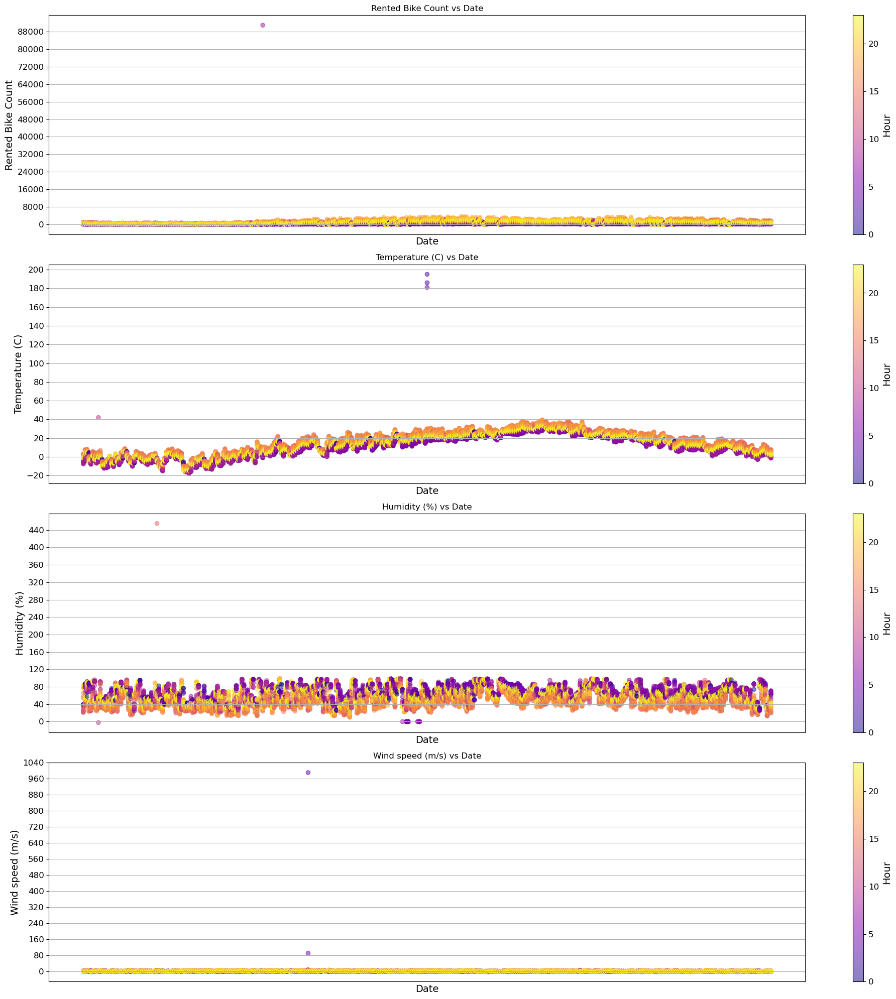

In [60]:
# List of columns to scatter plots
col_plots = ['Rented Bike Count', 'Temperature (C)', 'Humidity (%)', 'Wind speed (m/s)']

# Create a figure and axes
fig, axs = plt.subplots(4, 1, figsize=(20, 20), sharex=True)

# Flatten axes for easier iteration
axs = axs.flatten()

# Plotting
for i, column in enumerate(col_plots):
    sc = axs[i].scatter(df['Date'], df[column], c=df['Hour'], cmap='plasma', alpha=0.5)
    axs[i].set_ylabel(column)
    axs[i].set_xlabel('Date')   
    axs[i].set_title(column + ' vs Date')
    axs[i].set_xticks([])

    axs[i].yaxis.set_major_locator(MaxNLocator(nbins=15))

    # Add grid
    axs[i].grid(True)

    # Add colorbar
    cbar = plt.colorbar(sc, ax=axs[i])
    cbar.set_label('Hour')

# # Hide the last subplot
# axs[-1].axis('off')

# Layout adjustment
plt.tight_layout()

# Show plot
plt.show()

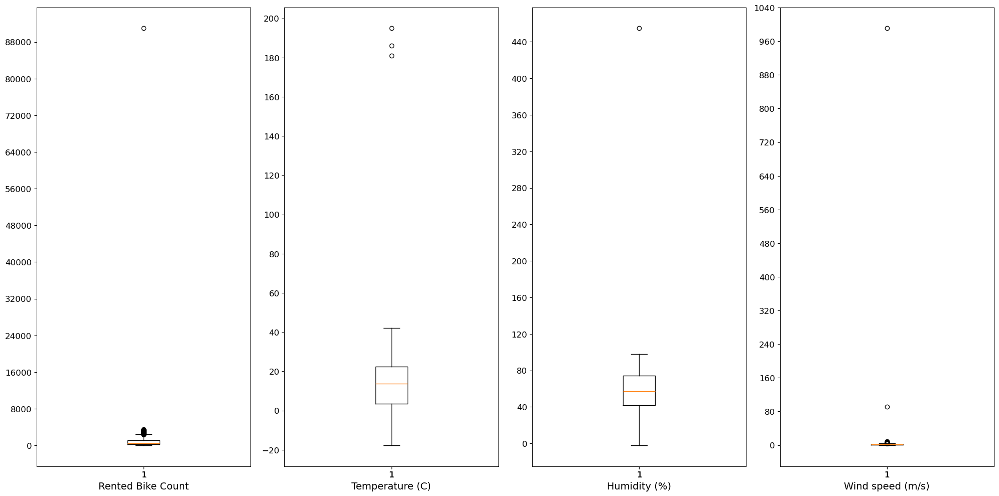

In [28]:
# List of columns to scatter plots
col_plots = ['Rented Bike Count', 'Temperature (C)', 'Humidity (%)', 'Wind speed (m/s)']

# Create a figure and axes
fig, axs = plt.subplots(1, 4, figsize=(20, 10), sharex=True)

# Flatten axes for easier iteration
axs = axs.flatten()

# Plotting
for i, column in enumerate(col_plots):
    axs[i].boxplot(df[column])
    axs[i].set_xlabel(column)
    axs[i].yaxis.set_major_locator(MaxNLocator(nbins=15))

# # Hide the last subplot
# axs[-1].axis('off')

# Layout adjustment
plt.tight_layout()

# Show plot
plt.show()

C:\Users\nguye\AppData\Local\Temp\ipykernel_12700\3419936788.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  data_num = data_num.applymap(lambda x:pd.to_numeric(x, errors='coerce'))


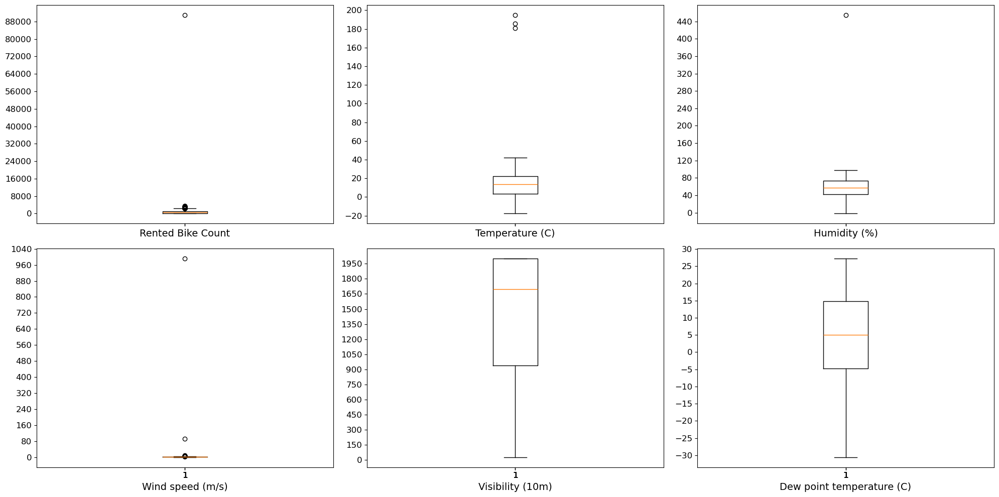

In [44]:
col_plots = ['Rented Bike Count', 'Temperature (C)', 'Humidity (%)', 'Wind speed (m/s)', 
             'Visibility (10m)', 'Dew point temperature (C)']

data_num = df.loc[:, col_plots]
data_num = data_num.applymap(lambda x:pd.to_numeric(x, errors='coerce'))
data_num.dropna(inplace=True) 

# Create a figure and axes
fig, axs = plt.subplots(2, 3, figsize=(20, 10), sharex=True)

# Flatten axes for easier iteration
axs = axs.flatten()

# Plotting
for i, column in enumerate(col_plots):
    axs[i].boxplot(data_num[column])
    axs[i].set_xlabel(column)
    axs[i].yaxis.set_major_locator(MaxNLocator(nbins=15))

# # Hide the last subplot
# axs[-1].axis('off')

# Layout adjustment
plt.tight_layout()

# Show plot
plt.show()

C:\Users\nguye\AppData\Local\Temp\ipykernel_12700\1373441555.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  data_num = data_num.applymap(lambda x:pd.to_numeric(x, errors='coerce'))


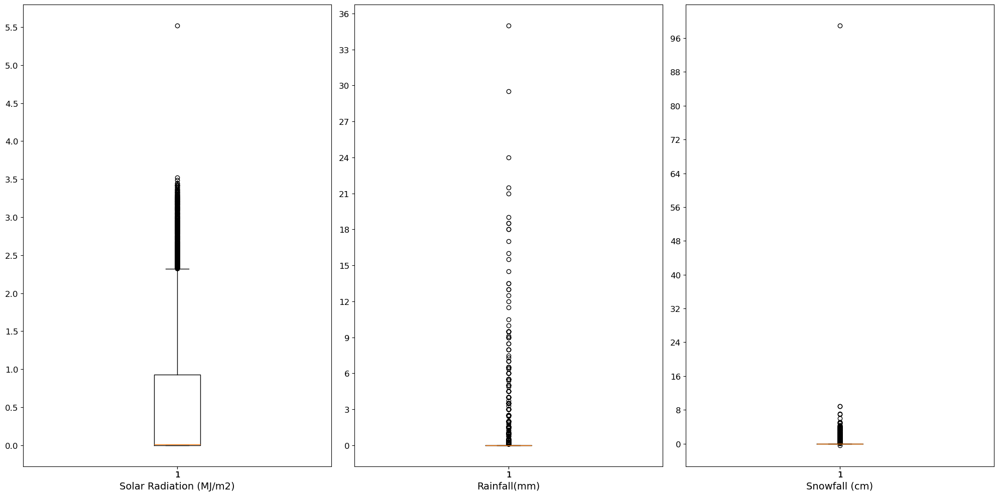

In [45]:
col_plots = ['Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']

data_num = df.loc[:, col_plots]
data_num = data_num.applymap(lambda x:pd.to_numeric(x, errors='coerce'))
data_num.dropna(inplace=True) 

# Create a figure and axes
fig, axs = plt.subplots(1, 3, figsize=(20, 10), sharex=True)

# Flatten axes for easier iteration
axs = axs.flatten()

# Plotting
for i, column in enumerate(col_plots):
    axs[i].boxplot(data_num[column])
    axs[i].set_xlabel(column)
    axs[i].yaxis.set_major_locator(MaxNLocator(nbins=15))

# # Hide the last subplot
# axs[-1].axis('off')

# Layout adjustment
plt.tight_layout()

# Show plot
plt.show()

C:\Users\nguye\AppData\Local\Temp\ipykernel_12700\561241432.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  data_num = data_num.applymap(lambda x: pd.to_numeric(x, errors='coerce'))


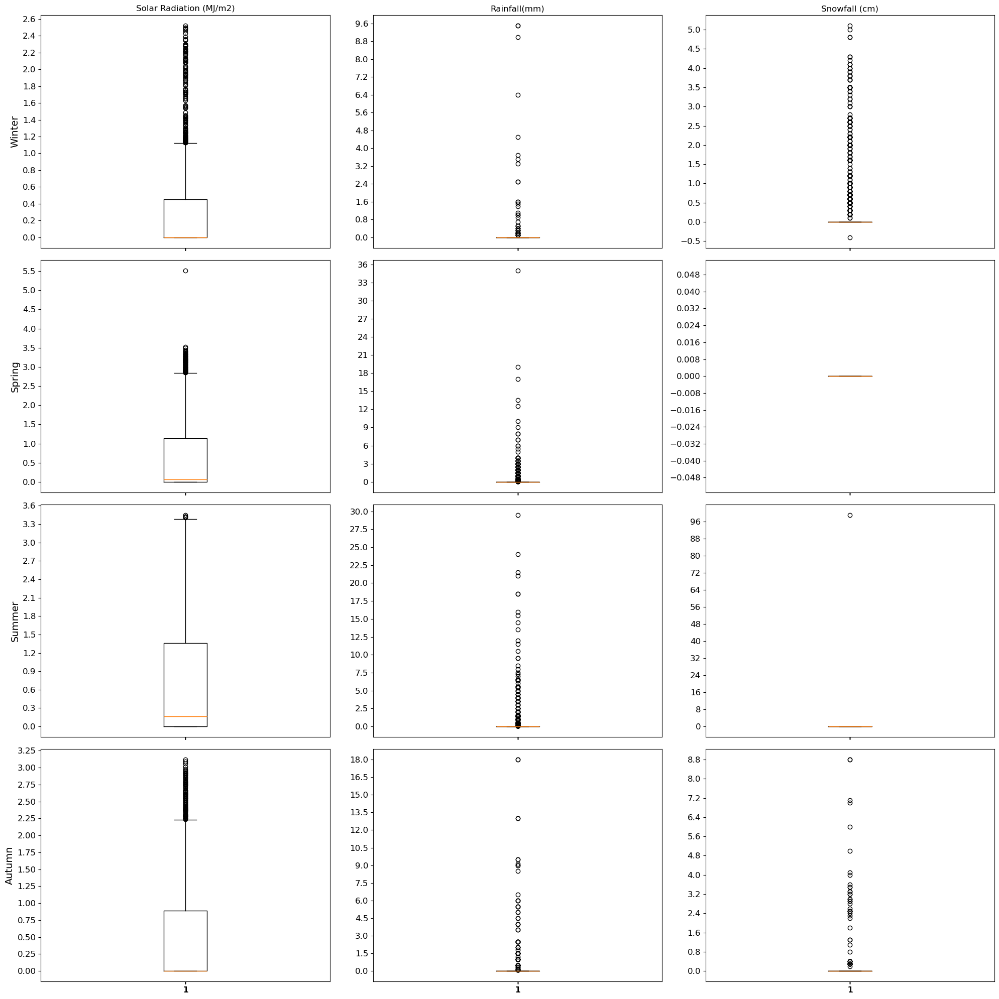

In [56]:
# Assuming df is your original DataFrame with a 'Season' column
col_plots = ['Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']

# Select the relevant columns, including the 'Season' column
data_num = df.loc[:, col_plots]
data_num = data_num.applymap(lambda x: pd.to_numeric(x, errors='coerce'))
data_num = pd.concat([data_num, df['Seasons']], axis=1)
data_num.dropna(inplace=True)

# # Exclude zero values
# for col in col_plots:
#     data_num = data_num[data_num[col] != 0]

# Get unique seasons
seasons = data_num['Seasons'].unique()

# Create a figure and axes
fig, axs = plt.subplots(len(seasons), len(col_plots), figsize=(20, 20), sharex=True)

# If there's only one season, axs may not be a 2D array
if len(seasons) == 1:
    axs = [axs]

# Plotting
for i, season in enumerate(seasons):
    season_data = data_num[data_num['Seasons'] == season]
    for j, column in enumerate(col_plots):
        axs[i][j].boxplot(season_data[column])
        if i == 0:  # Set title only for the top row
            axs[i][j].set_title(column)
        if j == 0:  # Set ylabel only for the first column
            axs[i][j].set_ylabel(season)
        axs[i][j].yaxis.set_major_locator(MaxNLocator(nbins=15))

# Layout adjustment
plt.tight_layout()

# Show plot
plt.show()

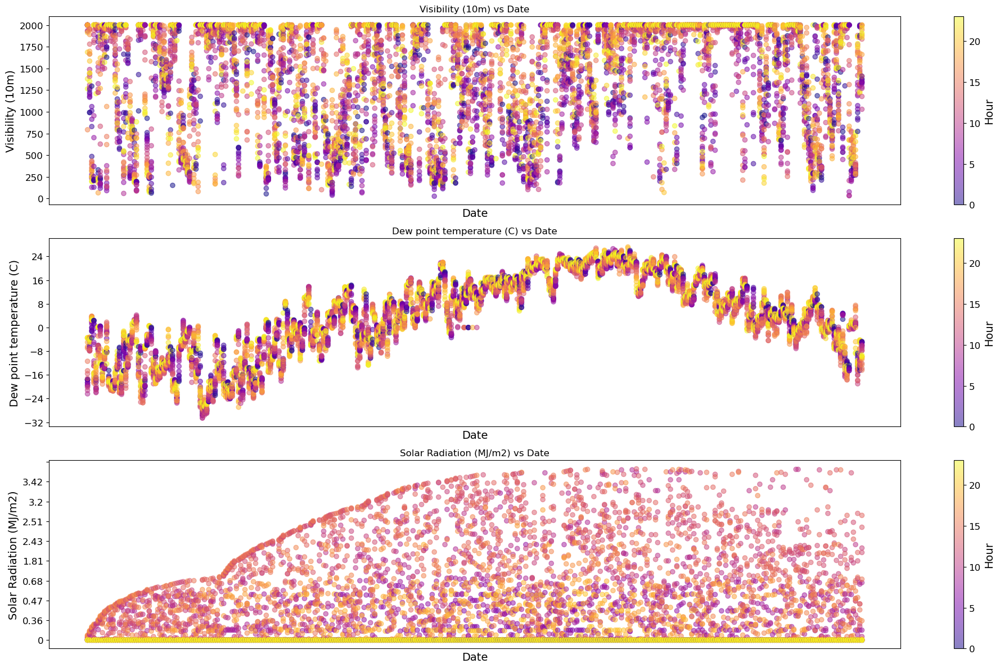

In [39]:
# List of columns to scatter plots
col_hists = ['Visibility (10m)', 'Dew point temperature (C)', 'Solar Radiation (MJ/m2)']

# Create a figure and axes
fig, axs = plt.subplots(3, 1, figsize=(20, 12), sharex=True)

# # Flatten axes for easier iteration
# axs = axs.flatten()

# Plotting
for ax, column in zip(axs, col_hists):
    sc = ax.scatter(df['Date'], df[column], c=df['Hour'], cmap='plasma', alpha=0.5)
    ax.set_ylabel(column)
    ax.set_xlabel('Date')   
    ax.set_title(column + ' vs Date')
    ax.set_xticks([])

    ax.yaxis.set_major_locator(MaxNLocator(nbins=10))

    # Add colorbar
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Hour')

# # Hide the last subplot
# axs[-1].axis('off')

# Layout adjustment
plt.tight_layout()

# Show plot
plt.show()

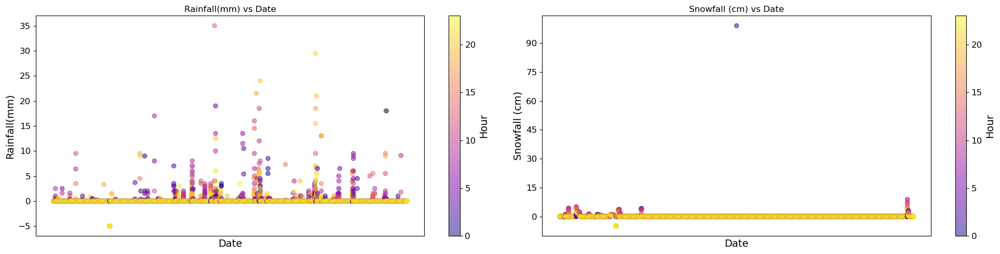

In [7]:
# List of columns to scatter plots
col_nums = ['Rainfall(mm)', 'Snowfall (cm)']

# Create a figure and axes
fig, axs = plt.subplots(1, 2, figsize=(20, 5), sharex=True)

# # Flatten axes for easier iteration
# axs = axs.flatten()

# Plotting
for ax, column in zip(axs, col_nums):
    data = df[column]
    data = data.replace({'No Record': '-5'}).astype(float)

    sc = ax.scatter(df['Date'], data, c=df['Hour'], cmap='plasma', alpha=0.5)
    ax.set_ylabel(column)
    ax.set_xlabel('Date')   
    ax.set_title(column + ' vs Date')
    ax.set_xticks([])

    ax.yaxis.set_major_locator(MaxNLocator(nbins=10))

    # Add colorbar
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Hour')

# # Hide the last subplot
# axs[-1].axis('off')

# Layout adjustment
plt.tight_layout()

# Show plot
plt.show()

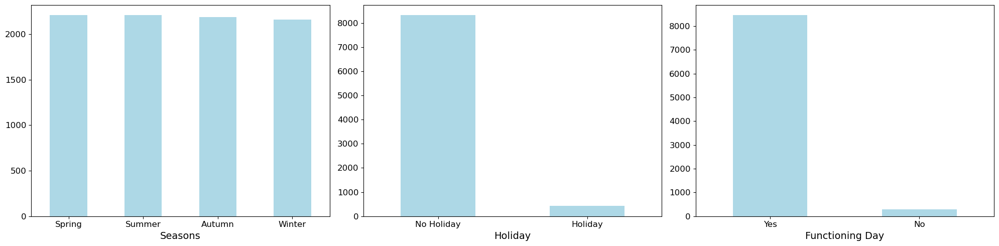

In [8]:
# List of columns to bar plots
col_bars = ['Seasons', 'Holiday', 'Functioning Day']  

# Create a figure and axes
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Plotting
for ax, column in zip(axes, col_bars):
    df[column].value_counts().plot(kind='bar', ax=ax, color='lightblue')
    # ax.set_title(column, loc='center')  
    ax.xaxis.set_tick_params(rotation=0)
    ax.grid(False)  

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

### 1.2 Cleaning the data

Do the following to the data:
 - Using the "Functioning day" feature, **remove rows from the DataFrame** where the business is closed and then **delete the Functioning Day feature from the DataFrame**.
 - **Convert seasons to a one hot encoded format** (1 binary feature for each of the 4 seasons).
 - Replace the **Weekday** feature with a binary weekday feature (1 for a weekday and 0 for weekend) using the code sample below or your own code.
 - **Convert remaining non-numerical features to a numerical format** or replace with NaN (i.e. `np.nan`) where not possible.
 - **Identify and fix any outliers and errors in the data**.

Save the result as a new csv file called `CleanedSeoulBikeData.csv` and **upload this** to MyUni along with this notebook when you submit your assignment.

In [9]:
## Example code for weekday feature mapping ##
import datetime
def date_is_weekday(datestring):
    ### return 0 if weekend, 1 if weekday
    dsplit = datestring.split('/')
    wday = datetime.datetime(int(dsplit[2]),int(dsplit[1]),int(dsplit[0])).weekday()
    return int(wday<=4)

In [10]:
### Your code here (and remember to upload the resulting csv)
# Remove not operating days and drop the 'Functioning Day' column
data = df.loc[df['Functioning Day'] == 'Yes']
data = data.drop(columns=['Functioning Day'])

# Convert season to one-hot encoding
data = pd.get_dummies(data, columns=['Seasons'], dtype=int)

# Replace 'Holiday' and 'No Holiday' with 1 and 0
data['Holiday'] = data['Holiday'].replace({'No Holiday': 0, 'Holiday': 1})

# Create 'Weekday' column with a binary weekday feature
# and drop the 'Date' column
data['Weekday'] = data['Date'].apply(date_is_weekday)
data = data.drop(columns=['Date'])

# Convert non-numeric features to numeric
data = data.applymap(lambda x:pd.to_numeric(x, errors='coerce'))

# Split the data into NA and non-NA values
data_no_na = data.dropna()
data_na = data[data.isna().any(axis=1)]

# Remove outliers (based on the visualizations)
data_no_na = data_no_na[(data_no_na['Rented Bike Count'] >= 0) & (data_no_na['Rented Bike Count'] < 8000) &
                        (data_no_na['Temperature (C)'] >= -20) & (data_no_na['Temperature (C)'] < 40) &
                        (data_no_na['Humidity (%)'] > 0) & (data_no_na['Humidity (%)'] < 100) &
                        (data_no_na['Wind speed (m/s)'] >= 0) & (data_no_na['Wind speed (m/s)'] < 10) &
                        (data_no_na['Snowfall (cm)'] >= 0) & (data_no_na['Snowfall (cm)'] < 15)]

# # Merge data
# data = pd.concat([data_no_na, data_na])

# # Save the data
# data.to_csv('SeoulBikeData_cleaned.csv', index=False)

C:\Users\nguye\AppData\Local\Temp\ipykernel_12700\696166906.py:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['Holiday'] = data['Holiday'].replace({'No Holiday': 0, 'Holiday': 1})
C:\Users\nguye\AppData\Local\Temp\ipykernel_12700\696166906.py:18: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  data = data.applymap(lambda x:pd.to_numeric(x, errors='coerce'))


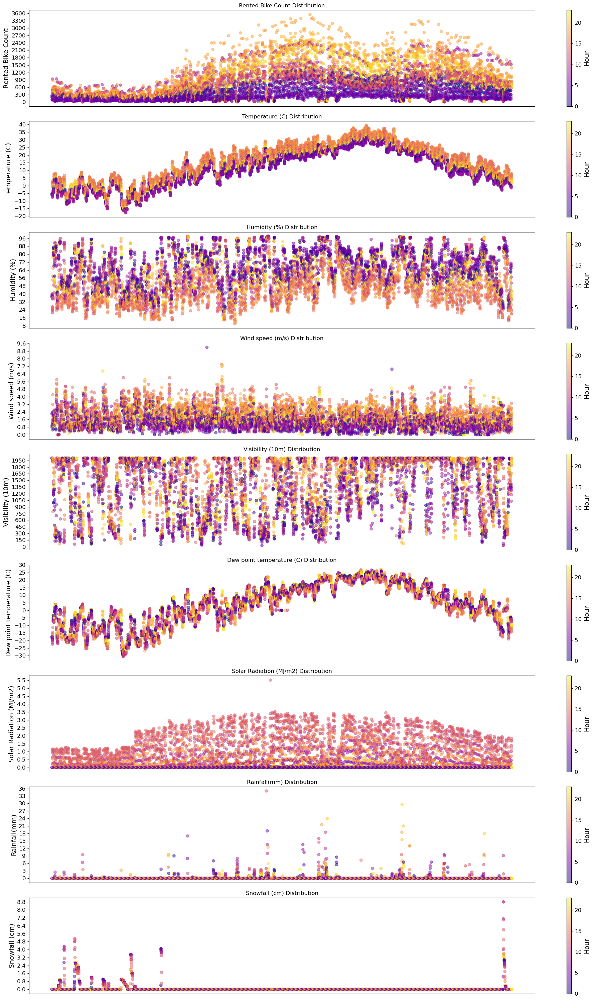

In [11]:
# Check distribution of the data after cleaning
# List of columns to scatter plots
col_plots = ['Rented Bike Count', 'Temperature (C)', 'Humidity (%)', 'Wind speed (m/s)', 
             'Visibility (10m)', 'Dew point temperature (C)', 'Solar Radiation (MJ/m2)',
             'Rainfall(mm)', 'Snowfall (cm)']

# Create a figure and axes
fig, axs = plt.subplots(9, 1, figsize=(20, 30), sharex=True)

# Flatten axes for easier iteration
axs = axs.flatten()

# Plotting
for i, column in enumerate(col_plots):
    sc = axs[i].scatter(np.arange(len(data_no_na)), data_no_na[column], c=data_no_na['Hour'], cmap='plasma', alpha=0.5)
    axs[i].set_ylabel(column)
    # axs[i].set_xlabel('Date')   
    axs[i].set_title(column + ' Distribution')
    axs[i].set_xticks([])

    axs[i].yaxis.set_major_locator(MaxNLocator(nbins=15))

    # Add colorbar
    cbar = plt.colorbar(sc, ax=axs[i])
    cbar.set_label('Hour')

# # Hide the last subplot
# axs[-1].axis('off')

# Layout adjustment
plt.tight_layout()

# Show plot
plt.show()

In [12]:
# Remove outliers (based on the visualizations)
data_no_na_2 = data_no_na[(data_no_na['Wind speed (m/s)'] < 6.4) &
                          (data_no_na['Solar Radiation (MJ/m2)'] < 5) &
                          (data_no_na['Rainfall(mm)'] < 24) &
                          (data_no_na['Snowfall (cm)'] < 5.6)]

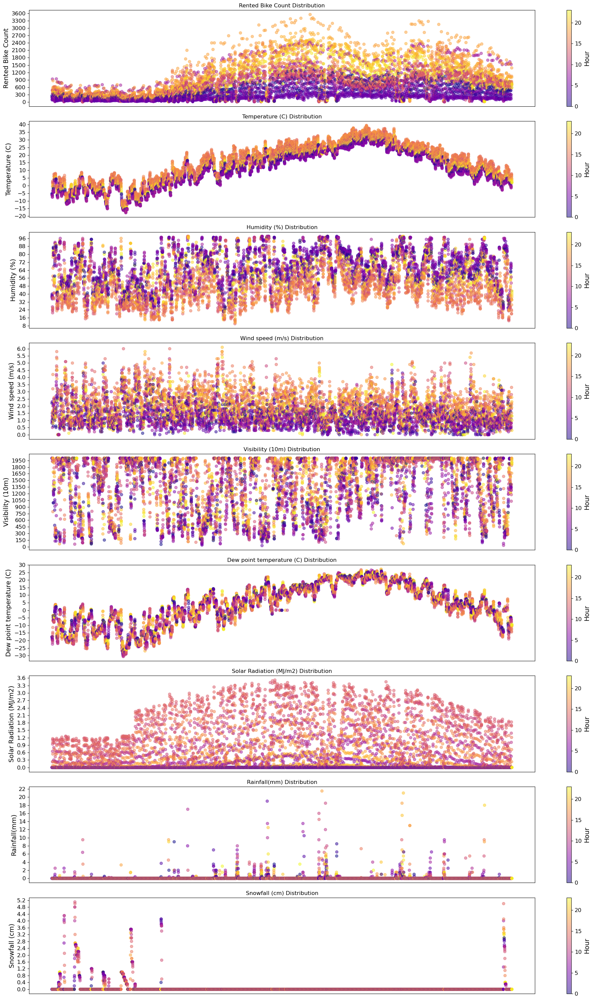

In [13]:
# Check distribution of the data after cleaning
# List of columns to scatter plots
col_plots = ['Rented Bike Count', 'Temperature (C)', 'Humidity (%)', 'Wind speed (m/s)', 
             'Visibility (10m)', 'Dew point temperature (C)', 'Solar Radiation (MJ/m2)',
             'Rainfall(mm)', 'Snowfall (cm)']

# Create a figure and axes
fig, axs = plt.subplots(9, 1, figsize=(20, 30), sharex=True)

# Flatten axes for easier iteration
axs = axs.flatten()

# Plotting
for i, column in enumerate(col_plots):
    sc = axs[i].scatter(np.arange(len(data_no_na_2)), data_no_na_2[column], 
                        c=data_no_na_2['Hour'], cmap='plasma', alpha=0.5)
    axs[i].set_ylabel(column)
    # axs[i].set_xlabel('Date')   
    axs[i].set_title(column + ' Distribution')
    axs[i].set_xticks([])

    axs[i].yaxis.set_major_locator(MaxNLocator(nbins=15))

    # Add colorbar
    cbar = plt.colorbar(sc, ax=axs[i])
    cbar.set_label('Hour')

# # Hide the last subplot
# axs[-1].axis('off')

# Layout adjustment
plt.tight_layout()

# Show plot
plt.show()

In [14]:
# Merge data
data = pd.concat([data_no_na_2, data_na])

# Save the data
data.to_csv('SeoulBikeData_cleaned.csv', index=False)

## Step 2: Pre-process the data and perform the first fit (20%)

### 2.1 Imputation and Pre-Processing

Make sure that you have set any problematic values in the numerical data to `np.nan` and then write code for a **sklearn *pipeline* that will perform imputation** to replace problematic entries (nan values) with an appropriate **median** value ***and* do any other pre-processing** that you think should be used.

In [15]:
# ### Your code here
# # Impute missing values with median
# imputer = SimpleImputer(strategy='median')
# imputer.fit(data)

# data_imputed = imputer.transform(data)
# data_imputed = pd.DataFrame(data_imputed, columns=data.columns)

# # Save the imputed data
# data_imputed.to_csv('SeoulBikeData_imputed.csv', index=False)

# # Normalize the data
# scaler = StandardScaler()
# scaler.fit(data_imputed)

# data_scaled = scaler.transform(data_imputed)
# data_scaled = pd.DataFrame(data_scaled, columns=data_imputed.columns)

In [16]:
### Your code here
# Pipeline for imputing and scaling the data 
pipeline = Pipeline([
 ('imputer', SimpleImputer(strategy="median")),
 ('scaler', StandardScaler()),
 ])

### 2.2 Predicting bike rentals

A regression approach will be used for this problem: that is, "bike rentals" will be treated as a real number whose value will be predicted. If necessary, it could be rounded to the nearest integer afterwards, but this will not be necessary here. The root mean squared error (RMSE) metric will be used to quantify performance.  

**Split the data** appropriately so that 20% of it will be kept as a hold-out test set. **Using the pipeline** you wrote above, pre-process and fit a ***linear regression* model** to the data in an appropriate way. After this, **calculate and print the RMSE of the fit to the training data**. 

To act as a simple baseline for comparison purposes, **also calculate and print the RMSE** that you would get if _all_ the predictions were set to be the **mean of the training targets** (i.e. bike rentals).

In [17]:
### Your code and outputs here
# Split data into features and target
X = data.drop(columns='Rented Bike Count')
y = data['Rented Bike Count']

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit and transform the training data
X_train_transformed = pipeline.fit_transform(X_train)

# Transform the test data
X_test_transformed = pipeline.transform(X_test)

# Fit a linear regression model to the training data
model = LinearRegression()
model.fit(X_train_transformed, y_train)

# Predict on the training data
y_train_pred = model.predict(X_train_transformed)

# Calculate RMSE of the fit to the training data
rmse_fit = np.sqrt(mean_squared_error(y_train, y_train_pred))
print(f"RMSE of the fit to the training data: {rmse_fit}")

# Calculate RMSE of the fit to the mean of the training data
y_train_mean_pred = np.full_like(y_train, y_train.mean())
rmse_mean = np.sqrt(mean_squared_error(y_train, y_train_mean_pred))
print(f"RMSE of the fit to the mean of the training data: {rmse_mean}")

RMSE of the fit to the training data: 429.719132348038
RMSE of the fit to the mean of the training data: 644.4462825810632


## Step 3: Hyper-parameter optimisation (30%)

**Use ChatGPT** (along with any modifications that you require) to create and run code (using sklearn pipelines) that will do the following:
 - fit a **linear regression** and a **Support Vector Regression** method to the data using **10-fold cross validation** for each model
 - display the **mean and standard deviation** of the **RMSE values** for each model (at baseline) in the _appropriate datasets_
 - perform a **hyper-parameter optimisation** on each model using **GridSearch**
 - display the **mean and standard deviation** of the **RMSE values** for each model (after optimisation) in the _appropriate datasets_
 - choose the **best model** and **visualise the results** with a single graphic of your choice

**Display the ChatGPT prompt** and the **code**, _including any fixes_ that you needed to make to get the code to work, along with the **outputs** obtained by running the code.


In [18]:
### Your ChatGPT prompt


In [19]:
### Code here (with outputs)


## Step 4: Further improvements (10%)

Consider the code that you obtained from ChatGPT above and find one error, or one thing that could be improved, or one reasonable alternative (even if it might not necessarily lead to an improvement).  **Describe this error/improvement/alternative in the box below.**

In [20]:
### Your answer here (maximum of 200 words)
